# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

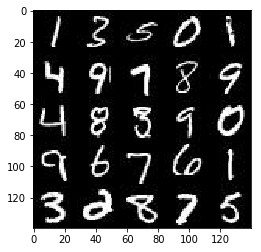

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

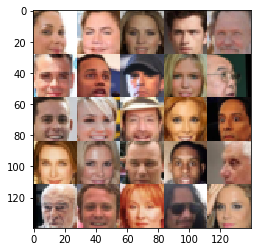

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape = (None, image_width, image_height, image_channels), name="input_real")
    input_z = tf.placeholder(tf.float32, shape = (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


In [6]:
def lrelu(bn, alpha=0.1):
    return tf.maximum(alpha * bn, bn)

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bn1 = tf.layers.batch_normalization(x1, training=True)
        relu1 = lrelu(bn1)
        # 16x16x128
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = lrelu(bn2)
        # 8x8x256
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        do3 = tf.nn.dropout(x3, 0.8)
        bn3 = tf.layers.batch_normalization(do3, training=True)
        relu3 = lrelu(bn3)
        # 4x4x512

        # Flatten it
        flat = tf.contrib.layers.flatten(relu3)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)

        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = lrelu(x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, kernel_size=5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = lrelu(x2)
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, kernel_size=5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = lrelu(x3)
        # 28x28x128 now
        
        # Output layer
        out = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same', activation=tf.tanh)
        # 28x28x3 now
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    label_smoothness = 0.1
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-label_smoothness)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss






"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                 # Run optimizers
                _ = sess.run(d_opt,
                             feed_dict={input_z: batch_z,
                                        input_real: batch_images,
                                        lr: learning_rate})
                _ = sess.run(g_opt, 
                             feed_dict={input_z: batch_z, 
                                        input_real: batch_images,
                                        lr: learning_rate})
                                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    #Print the current image
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5320... Generator Loss: 30.8773
Epoch 1/2... Discriminator Loss: 0.5123... Generator Loss: 15.8335
Epoch 1/2... Discriminator Loss: 0.4073... Generator Loss: 4.4663
Epoch 1/2... Discriminator Loss: 1.8718... Generator Loss: 22.9266
Epoch 1/2... Discriminator Loss: 0.5283... Generator Loss: 2.6817
Epoch 1/2... Discriminator Loss: 4.0372... Generator Loss: 0.0940
Epoch 1/2... Discriminator Loss: 1.9037... Generator Loss: 0.6045
Epoch 1/2... Discriminator Loss: 3.2777... Generator Loss: 0.1846
Epoch 1/2... Discriminator Loss: 2.3560... Generator Loss: 0.2426
Epoch 1/2... Discriminator Loss: 2.0400... Generator Loss: 0.2662


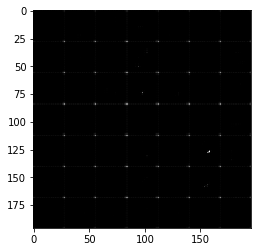

Epoch 1/2... Discriminator Loss: 1.8434... Generator Loss: 0.2984
Epoch 1/2... Discriminator Loss: 1.8145... Generator Loss: 0.3416
Epoch 1/2... Discriminator Loss: 1.8605... Generator Loss: 0.2913
Epoch 1/2... Discriminator Loss: 1.8638... Generator Loss: 0.2996
Epoch 1/2... Discriminator Loss: 1.8640... Generator Loss: 0.3329
Epoch 1/2... Discriminator Loss: 1.7947... Generator Loss: 0.3386
Epoch 1/2... Discriminator Loss: 1.8783... Generator Loss: 0.3386
Epoch 1/2... Discriminator Loss: 1.5033... Generator Loss: 0.4108
Epoch 1/2... Discriminator Loss: 2.0098... Generator Loss: 0.2719
Epoch 1/2... Discriminator Loss: 1.9850... Generator Loss: 0.2811


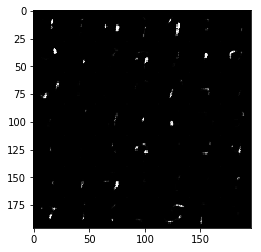

Epoch 1/2... Discriminator Loss: 1.7598... Generator Loss: 0.4049
Epoch 1/2... Discriminator Loss: 1.8115... Generator Loss: 0.3447
Epoch 1/2... Discriminator Loss: 1.7453... Generator Loss: 0.3391
Epoch 1/2... Discriminator Loss: 1.8136... Generator Loss: 0.3601
Epoch 1/2... Discriminator Loss: 1.5666... Generator Loss: 0.3810
Epoch 1/2... Discriminator Loss: 1.6725... Generator Loss: 0.4306
Epoch 1/2... Discriminator Loss: 1.5928... Generator Loss: 0.3777
Epoch 1/2... Discriminator Loss: 2.0583... Generator Loss: 0.2253
Epoch 1/2... Discriminator Loss: 1.7500... Generator Loss: 0.3392
Epoch 1/2... Discriminator Loss: 2.0324... Generator Loss: 0.2732


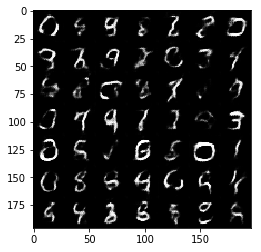

Epoch 1/2... Discriminator Loss: 1.6630... Generator Loss: 0.4256
Epoch 1/2... Discriminator Loss: 1.7449... Generator Loss: 0.3312
Epoch 1/2... Discriminator Loss: 1.8586... Generator Loss: 0.3269
Epoch 1/2... Discriminator Loss: 1.8152... Generator Loss: 0.3236
Epoch 1/2... Discriminator Loss: 1.5893... Generator Loss: 0.3856
Epoch 1/2... Discriminator Loss: 1.6865... Generator Loss: 0.3831
Epoch 1/2... Discriminator Loss: 1.6542... Generator Loss: 0.4048
Epoch 1/2... Discriminator Loss: 1.6564... Generator Loss: 0.3684
Epoch 1/2... Discriminator Loss: 2.1524... Generator Loss: 0.2102
Epoch 1/2... Discriminator Loss: 1.7420... Generator Loss: 0.3367


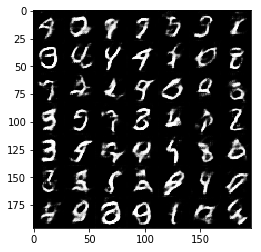

Epoch 1/2... Discriminator Loss: 1.6497... Generator Loss: 0.4127
Epoch 1/2... Discriminator Loss: 1.6506... Generator Loss: 0.3616
Epoch 1/2... Discriminator Loss: 1.8908... Generator Loss: 0.3273
Epoch 1/2... Discriminator Loss: 2.0168... Generator Loss: 0.2756
Epoch 1/2... Discriminator Loss: 1.3472... Generator Loss: 0.7348
Epoch 1/2... Discriminator Loss: 1.2761... Generator Loss: 1.3274
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 1.2754
Epoch 1/2... Discriminator Loss: 1.5433... Generator Loss: 1.7969
Epoch 1/2... Discriminator Loss: 1.2702... Generator Loss: 1.2182
Epoch 1/2... Discriminator Loss: 1.4880... Generator Loss: 1.4926


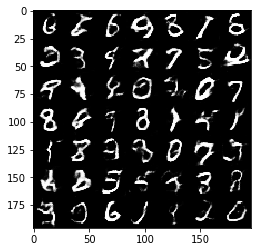

Epoch 1/2... Discriminator Loss: 1.4011... Generator Loss: 1.4361
Epoch 1/2... Discriminator Loss: 1.2247... Generator Loss: 1.3074
Epoch 1/2... Discriminator Loss: 1.3676... Generator Loss: 1.5089
Epoch 1/2... Discriminator Loss: 1.2809... Generator Loss: 1.2036
Epoch 1/2... Discriminator Loss: 1.4438... Generator Loss: 1.3320
Epoch 1/2... Discriminator Loss: 1.8061... Generator Loss: 1.8883
Epoch 1/2... Discriminator Loss: 1.4357... Generator Loss: 1.6957
Epoch 1/2... Discriminator Loss: 1.3781... Generator Loss: 1.7118
Epoch 1/2... Discriminator Loss: 1.4784... Generator Loss: 1.5416
Epoch 1/2... Discriminator Loss: 1.4748... Generator Loss: 1.7821


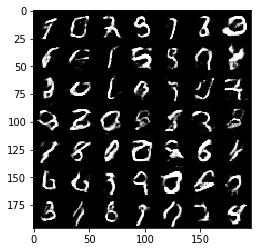

Epoch 1/2... Discriminator Loss: 1.4719... Generator Loss: 1.4218
Epoch 1/2... Discriminator Loss: 1.3245... Generator Loss: 1.4292
Epoch 1/2... Discriminator Loss: 1.5291... Generator Loss: 1.6714
Epoch 1/2... Discriminator Loss: 1.6612... Generator Loss: 1.8976
Epoch 1/2... Discriminator Loss: 1.2763... Generator Loss: 1.4949
Epoch 1/2... Discriminator Loss: 1.5088... Generator Loss: 1.8591
Epoch 1/2... Discriminator Loss: 1.2603... Generator Loss: 0.7857
Epoch 1/2... Discriminator Loss: 1.4503... Generator Loss: 0.5110
Epoch 1/2... Discriminator Loss: 1.5184... Generator Loss: 0.4825
Epoch 1/2... Discriminator Loss: 1.2522... Generator Loss: 0.6594


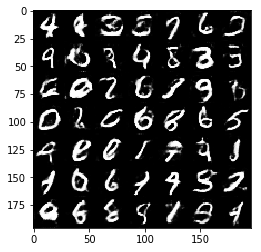

Epoch 1/2... Discriminator Loss: 1.4309... Generator Loss: 1.5690
Epoch 1/2... Discriminator Loss: 1.4627... Generator Loss: 1.8260
Epoch 1/2... Discriminator Loss: 1.3796... Generator Loss: 1.7054
Epoch 1/2... Discriminator Loss: 1.9262... Generator Loss: 0.3331
Epoch 1/2... Discriminator Loss: 1.3974... Generator Loss: 0.5584
Epoch 1/2... Discriminator Loss: 1.8704... Generator Loss: 0.3332
Epoch 1/2... Discriminator Loss: 1.4957... Generator Loss: 0.4583
Epoch 1/2... Discriminator Loss: 1.5690... Generator Loss: 0.4357
Epoch 1/2... Discriminator Loss: 1.6326... Generator Loss: 0.3902
Epoch 1/2... Discriminator Loss: 1.4392... Generator Loss: 0.5073


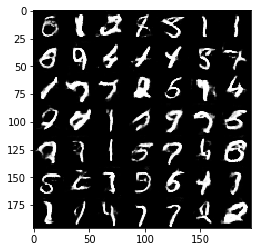

Epoch 1/2... Discriminator Loss: 1.3924... Generator Loss: 0.6005
Epoch 1/2... Discriminator Loss: 1.7466... Generator Loss: 0.3644
Epoch 1/2... Discriminator Loss: 1.3373... Generator Loss: 0.5619
Epoch 1/2... Discriminator Loss: 1.2694... Generator Loss: 0.7459
Epoch 1/2... Discriminator Loss: 1.4455... Generator Loss: 0.4974
Epoch 1/2... Discriminator Loss: 1.4346... Generator Loss: 0.6877
Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.9284
Epoch 1/2... Discriminator Loss: 1.1436... Generator Loss: 1.3716
Epoch 1/2... Discriminator Loss: 1.2057... Generator Loss: 1.1750
Epoch 1/2... Discriminator Loss: 1.4082... Generator Loss: 1.6683


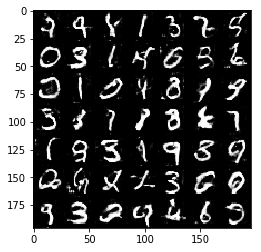

Epoch 1/2... Discriminator Loss: 1.7106... Generator Loss: 0.4215
Epoch 1/2... Discriminator Loss: 1.5392... Generator Loss: 0.4405
Epoch 1/2... Discriminator Loss: 1.2155... Generator Loss: 0.7495
Epoch 2/2... Discriminator Loss: 1.5436... Generator Loss: 0.4458
Epoch 2/2... Discriminator Loss: 1.4144... Generator Loss: 0.5377
Epoch 2/2... Discriminator Loss: 1.1672... Generator Loss: 0.8830
Epoch 2/2... Discriminator Loss: 1.3562... Generator Loss: 2.0669
Epoch 2/2... Discriminator Loss: 0.9229... Generator Loss: 1.3833
Epoch 2/2... Discriminator Loss: 1.1720... Generator Loss: 1.3978
Epoch 2/2... Discriminator Loss: 1.0833... Generator Loss: 1.2945


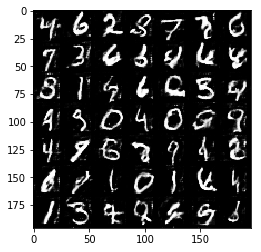

Epoch 2/2... Discriminator Loss: 1.4263... Generator Loss: 1.7359
Epoch 2/2... Discriminator Loss: 1.0295... Generator Loss: 1.0569
Epoch 2/2... Discriminator Loss: 1.1519... Generator Loss: 1.0596
Epoch 2/2... Discriminator Loss: 1.7731... Generator Loss: 0.3031
Epoch 2/2... Discriminator Loss: 1.3552... Generator Loss: 0.5234
Epoch 2/2... Discriminator Loss: 1.1564... Generator Loss: 0.9511
Epoch 2/2... Discriminator Loss: 1.2988... Generator Loss: 1.4863
Epoch 2/2... Discriminator Loss: 1.6867... Generator Loss: 0.3707
Epoch 2/2... Discriminator Loss: 1.1137... Generator Loss: 1.9005
Epoch 2/2... Discriminator Loss: 0.9926... Generator Loss: 1.1115


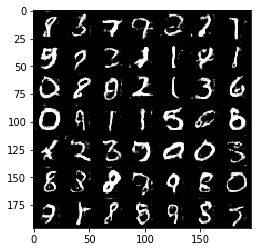

Epoch 2/2... Discriminator Loss: 1.3149... Generator Loss: 1.7365
Epoch 2/2... Discriminator Loss: 1.0436... Generator Loss: 1.3851
Epoch 2/2... Discriminator Loss: 1.5356... Generator Loss: 0.4799
Epoch 2/2... Discriminator Loss: 1.1786... Generator Loss: 0.7475
Epoch 2/2... Discriminator Loss: 1.2040... Generator Loss: 0.7939
Epoch 2/2... Discriminator Loss: 1.1641... Generator Loss: 1.2549
Epoch 2/2... Discriminator Loss: 1.0098... Generator Loss: 1.4440
Epoch 2/2... Discriminator Loss: 0.9600... Generator Loss: 1.3811
Epoch 2/2... Discriminator Loss: 1.1046... Generator Loss: 0.9861
Epoch 2/2... Discriminator Loss: 2.0200... Generator Loss: 0.2705


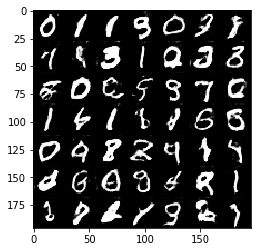

Epoch 2/2... Discriminator Loss: 1.0763... Generator Loss: 1.5888
Epoch 2/2... Discriminator Loss: 0.8692... Generator Loss: 1.5119
Epoch 2/2... Discriminator Loss: 1.1062... Generator Loss: 1.0821
Epoch 2/2... Discriminator Loss: 1.1953... Generator Loss: 0.7808
Epoch 2/2... Discriminator Loss: 1.2054... Generator Loss: 1.8649
Epoch 2/2... Discriminator Loss: 1.5819... Generator Loss: 0.4117
Epoch 2/2... Discriminator Loss: 1.3007... Generator Loss: 0.5819
Epoch 2/2... Discriminator Loss: 1.6134... Generator Loss: 0.4571
Epoch 2/2... Discriminator Loss: 1.1456... Generator Loss: 0.7985
Epoch 2/2... Discriminator Loss: 1.6422... Generator Loss: 0.4156


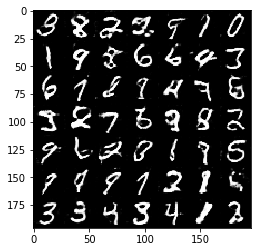

Epoch 2/2... Discriminator Loss: 1.5797... Generator Loss: 0.4161
Epoch 2/2... Discriminator Loss: 0.8077... Generator Loss: 1.4725
Epoch 2/2... Discriminator Loss: 1.4471... Generator Loss: 0.4857
Epoch 2/2... Discriminator Loss: 1.4347... Generator Loss: 0.5713
Epoch 2/2... Discriminator Loss: 1.6336... Generator Loss: 0.3840
Epoch 2/2... Discriminator Loss: 1.4907... Generator Loss: 0.5024
Epoch 2/2... Discriminator Loss: 1.2066... Generator Loss: 0.7044
Epoch 2/2... Discriminator Loss: 1.2981... Generator Loss: 0.6341
Epoch 2/2... Discriminator Loss: 0.9508... Generator Loss: 1.0928
Epoch 2/2... Discriminator Loss: 1.0596... Generator Loss: 2.0813


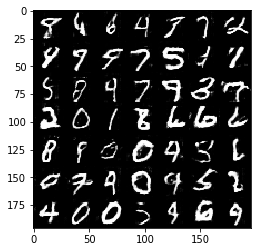

Epoch 2/2... Discriminator Loss: 1.3243... Generator Loss: 2.4481
Epoch 2/2... Discriminator Loss: 0.9392... Generator Loss: 1.5287
Epoch 2/2... Discriminator Loss: 1.2870... Generator Loss: 1.7252
Epoch 2/2... Discriminator Loss: 1.6486... Generator Loss: 0.4523
Epoch 2/2... Discriminator Loss: 1.0934... Generator Loss: 1.9350
Epoch 2/2... Discriminator Loss: 1.1655... Generator Loss: 1.8628
Epoch 2/2... Discriminator Loss: 1.1351... Generator Loss: 0.9652
Epoch 2/2... Discriminator Loss: 1.1873... Generator Loss: 0.8109
Epoch 2/2... Discriminator Loss: 1.4087... Generator Loss: 2.4750
Epoch 2/2... Discriminator Loss: 1.1845... Generator Loss: 0.8585


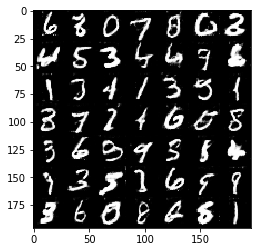

Epoch 2/2... Discriminator Loss: 0.9943... Generator Loss: 1.4063
Epoch 2/2... Discriminator Loss: 1.1038... Generator Loss: 1.0191
Epoch 2/2... Discriminator Loss: 0.9778... Generator Loss: 1.5957
Epoch 2/2... Discriminator Loss: 1.7619... Generator Loss: 0.3901
Epoch 2/2... Discriminator Loss: 0.9242... Generator Loss: 1.1570
Epoch 2/2... Discriminator Loss: 1.2000... Generator Loss: 0.7661
Epoch 2/2... Discriminator Loss: 1.5175... Generator Loss: 0.5706
Epoch 2/2... Discriminator Loss: 0.8420... Generator Loss: 1.8574
Epoch 2/2... Discriminator Loss: 0.8544... Generator Loss: 1.4167
Epoch 2/2... Discriminator Loss: 1.0895... Generator Loss: 1.0056


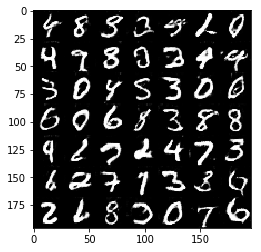

Epoch 2/2... Discriminator Loss: 1.2449... Generator Loss: 0.8226
Epoch 2/2... Discriminator Loss: 1.9749... Generator Loss: 0.3151
Epoch 2/2... Discriminator Loss: 1.6840... Generator Loss: 2.8984
Epoch 2/2... Discriminator Loss: 0.7517... Generator Loss: 2.0320
Epoch 2/2... Discriminator Loss: 1.7470... Generator Loss: 0.4059
Epoch 2/2... Discriminator Loss: 0.7907... Generator Loss: 1.6277
Epoch 2/2... Discriminator Loss: 2.0775... Generator Loss: 0.2969
Epoch 2/2... Discriminator Loss: 1.0454... Generator Loss: 0.9487
Epoch 2/2... Discriminator Loss: 1.7570... Generator Loss: 0.3847
Epoch 2/2... Discriminator Loss: 0.9429... Generator Loss: 1.0825


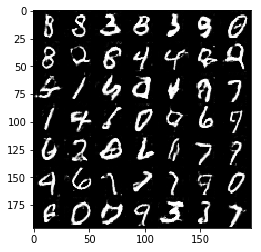

Epoch 2/2... Discriminator Loss: 0.8710... Generator Loss: 2.2724
Epoch 2/2... Discriminator Loss: 0.9303... Generator Loss: 1.1131
Epoch 2/2... Discriminator Loss: 1.2133... Generator Loss: 0.7906
Epoch 2/2... Discriminator Loss: 1.4704... Generator Loss: 0.5426
Epoch 2/2... Discriminator Loss: 0.7452... Generator Loss: 1.5456
Epoch 2/2... Discriminator Loss: 1.0999... Generator Loss: 0.9349
Epoch 2/2... Discriminator Loss: 0.6708... Generator Loss: 2.2210
Epoch 2/2... Discriminator Loss: 1.4476... Generator Loss: 0.6330
Epoch 2/2... Discriminator Loss: 0.8436... Generator Loss: 1.2110
Epoch 2/2... Discriminator Loss: 1.7610... Generator Loss: 0.4135


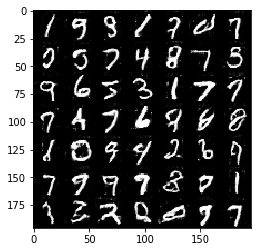

Epoch 2/2... Discriminator Loss: 0.9139... Generator Loss: 1.0677
Epoch 2/2... Discriminator Loss: 1.1633... Generator Loss: 0.8385
Epoch 2/2... Discriminator Loss: 1.2750... Generator Loss: 2.4524
Epoch 2/2... Discriminator Loss: 1.0101... Generator Loss: 0.9690
Epoch 2/2... Discriminator Loss: 0.9007... Generator Loss: 1.3572
Epoch 2/2... Discriminator Loss: 1.3210... Generator Loss: 2.6552
Epoch 2/2... Discriminator Loss: 1.4043... Generator Loss: 0.6804


In [13]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 1.3136... Generator Loss: 24.0619
Epoch 1/2... Discriminator Loss: 2.5645... Generator Loss: 5.3725
Epoch 1/2... Discriminator Loss: 3.8585... Generator Loss: 5.8029
Epoch 1/2... Discriminator Loss: 5.4112... Generator Loss: 6.8275
Epoch 1/2... Discriminator Loss: 1.0976... Generator Loss: 0.9303
Epoch 1/2... Discriminator Loss: 3.8242... Generator Loss: 0.0634
Epoch 1/2... Discriminator Loss: 4.6101... Generator Loss: 0.0244
Epoch 1/2... Discriminator Loss: 0.8092... Generator Loss: 1.3949
Epoch 1/2... Discriminator Loss: 1.6206... Generator Loss: 0.4623
Epoch 1/2... Discriminator Loss: 0.5389... Generator Loss: 2.2304


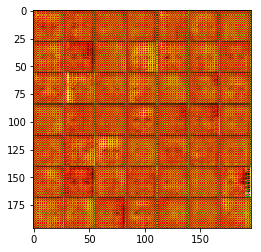

Epoch 1/2... Discriminator Loss: 2.6798... Generator Loss: 4.1888
Epoch 1/2... Discriminator Loss: 0.9749... Generator Loss: 1.9786
Epoch 1/2... Discriminator Loss: 1.1898... Generator Loss: 1.0242
Epoch 1/2... Discriminator Loss: 2.3614... Generator Loss: 2.5336
Epoch 1/2... Discriminator Loss: 0.8769... Generator Loss: 1.2627
Epoch 1/2... Discriminator Loss: 2.0345... Generator Loss: 1.1367
Epoch 1/2... Discriminator Loss: 1.7445... Generator Loss: 0.3200
Epoch 1/2... Discriminator Loss: 1.7880... Generator Loss: 0.3490
Epoch 1/2... Discriminator Loss: 1.5227... Generator Loss: 0.6937
Epoch 1/2... Discriminator Loss: 1.5047... Generator Loss: 1.3293


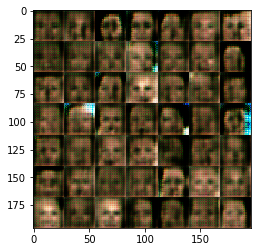

Epoch 1/2... Discriminator Loss: 1.8274... Generator Loss: 1.7399
Epoch 1/2... Discriminator Loss: 1.8899... Generator Loss: 1.8168
Epoch 1/2... Discriminator Loss: 1.7459... Generator Loss: 1.7900
Epoch 1/2... Discriminator Loss: 1.3444... Generator Loss: 0.8692
Epoch 1/2... Discriminator Loss: 2.1062... Generator Loss: 1.8506
Epoch 1/2... Discriminator Loss: 1.9785... Generator Loss: 2.1754
Epoch 1/2... Discriminator Loss: 1.7474... Generator Loss: 0.3523
Epoch 1/2... Discriminator Loss: 1.7916... Generator Loss: 0.3144
Epoch 1/2... Discriminator Loss: 1.4065... Generator Loss: 0.5913
Epoch 1/2... Discriminator Loss: 2.0953... Generator Loss: 2.1125


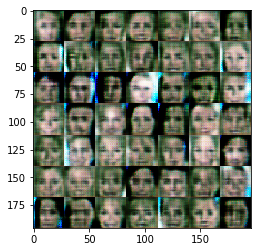

Epoch 1/2... Discriminator Loss: 1.3797... Generator Loss: 0.7174
Epoch 1/2... Discriminator Loss: 1.6150... Generator Loss: 0.4666
Epoch 1/2... Discriminator Loss: 1.4296... Generator Loss: 1.2285
Epoch 1/2... Discriminator Loss: 1.7579... Generator Loss: 0.3129
Epoch 1/2... Discriminator Loss: 1.6124... Generator Loss: 0.4362
Epoch 1/2... Discriminator Loss: 1.5239... Generator Loss: 0.5382
Epoch 1/2... Discriminator Loss: 1.5821... Generator Loss: 0.4000
Epoch 1/2... Discriminator Loss: 1.4427... Generator Loss: 0.5398
Epoch 1/2... Discriminator Loss: 1.6518... Generator Loss: 0.4336
Epoch 1/2... Discriminator Loss: 1.5068... Generator Loss: 0.4888


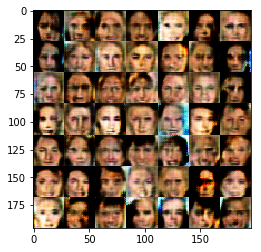

Epoch 1/2... Discriminator Loss: 1.4380... Generator Loss: 1.2166
Epoch 1/2... Discriminator Loss: 1.8867... Generator Loss: 1.6328
Epoch 1/2... Discriminator Loss: 1.5637... Generator Loss: 1.3165
Epoch 1/2... Discriminator Loss: 1.5545... Generator Loss: 0.5315
Epoch 1/2... Discriminator Loss: 1.4964... Generator Loss: 0.5466
Epoch 1/2... Discriminator Loss: 1.4345... Generator Loss: 0.7351
Epoch 1/2... Discriminator Loss: 1.4219... Generator Loss: 0.7549
Epoch 1/2... Discriminator Loss: 1.6482... Generator Loss: 1.1143
Epoch 1/2... Discriminator Loss: 1.3263... Generator Loss: 0.6670
Epoch 1/2... Discriminator Loss: 1.4232... Generator Loss: 0.9979


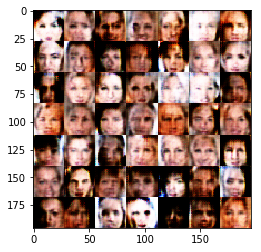

Epoch 1/2... Discriminator Loss: 1.5158... Generator Loss: 1.1608
Epoch 1/2... Discriminator Loss: 1.4034... Generator Loss: 0.6901
Epoch 1/2... Discriminator Loss: 1.4186... Generator Loss: 0.9397
Epoch 1/2... Discriminator Loss: 1.4429... Generator Loss: 0.9875
Epoch 1/2... Discriminator Loss: 1.4904... Generator Loss: 1.0296
Epoch 1/2... Discriminator Loss: 1.4701... Generator Loss: 0.9982
Epoch 1/2... Discriminator Loss: 1.3634... Generator Loss: 0.5944
Epoch 1/2... Discriminator Loss: 1.4837... Generator Loss: 0.6182
Epoch 1/2... Discriminator Loss: 1.5403... Generator Loss: 0.5547
Epoch 1/2... Discriminator Loss: 1.5830... Generator Loss: 0.3692


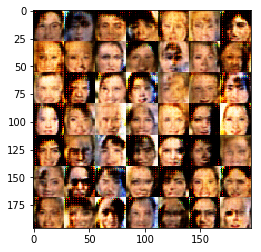

Epoch 1/2... Discriminator Loss: 1.4613... Generator Loss: 1.1680
Epoch 1/2... Discriminator Loss: 1.3974... Generator Loss: 0.7594
Epoch 1/2... Discriminator Loss: 1.4781... Generator Loss: 1.1598
Epoch 1/2... Discriminator Loss: 1.3738... Generator Loss: 0.6992
Epoch 1/2... Discriminator Loss: 1.5611... Generator Loss: 0.4540
Epoch 1/2... Discriminator Loss: 1.5865... Generator Loss: 1.1571
Epoch 1/2... Discriminator Loss: 1.3618... Generator Loss: 0.7702
Epoch 1/2... Discriminator Loss: 1.3909... Generator Loss: 0.9105
Epoch 1/2... Discriminator Loss: 1.4942... Generator Loss: 1.0819
Epoch 1/2... Discriminator Loss: 1.4567... Generator Loss: 1.1536


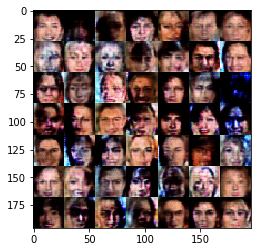

Epoch 1/2... Discriminator Loss: 1.3515... Generator Loss: 0.6862
Epoch 1/2... Discriminator Loss: 1.4627... Generator Loss: 0.5620
Epoch 1/2... Discriminator Loss: 1.4083... Generator Loss: 0.7261
Epoch 1/2... Discriminator Loss: 1.5694... Generator Loss: 1.0732
Epoch 1/2... Discriminator Loss: 1.3663... Generator Loss: 0.7746
Epoch 1/2... Discriminator Loss: 1.4202... Generator Loss: 0.8231
Epoch 1/2... Discriminator Loss: 1.4605... Generator Loss: 0.5614
Epoch 1/2... Discriminator Loss: 1.5303... Generator Loss: 0.7186
Epoch 1/2... Discriminator Loss: 1.3500... Generator Loss: 0.7454
Epoch 1/2... Discriminator Loss: 1.4413... Generator Loss: 0.8127


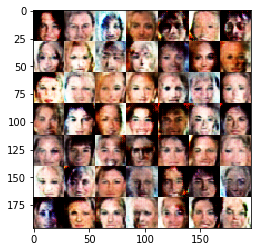

Epoch 1/2... Discriminator Loss: 1.4440... Generator Loss: 0.5745
Epoch 1/2... Discriminator Loss: 1.3744... Generator Loss: 0.8322
Epoch 1/2... Discriminator Loss: 1.3718... Generator Loss: 0.6640
Epoch 1/2... Discriminator Loss: 1.2935... Generator Loss: 0.8650
Epoch 1/2... Discriminator Loss: 1.3793... Generator Loss: 0.8666
Epoch 1/2... Discriminator Loss: 1.6022... Generator Loss: 0.4023
Epoch 1/2... Discriminator Loss: 1.4024... Generator Loss: 0.6738
Epoch 1/2... Discriminator Loss: 1.3810... Generator Loss: 0.7271
Epoch 1/2... Discriminator Loss: 1.4400... Generator Loss: 0.5497
Epoch 1/2... Discriminator Loss: 1.5011... Generator Loss: 0.5517


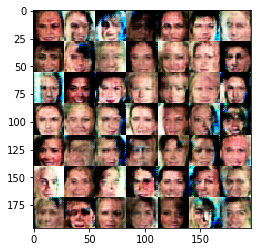

Epoch 1/2... Discriminator Loss: 1.4498... Generator Loss: 0.5962
Epoch 1/2... Discriminator Loss: 1.4247... Generator Loss: 0.8475
Epoch 1/2... Discriminator Loss: 1.3834... Generator Loss: 0.8465
Epoch 1/2... Discriminator Loss: 1.5959... Generator Loss: 0.4132
Epoch 1/2... Discriminator Loss: 1.4008... Generator Loss: 0.9181
Epoch 1/2... Discriminator Loss: 1.3871... Generator Loss: 0.8573
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.7944
Epoch 1/2... Discriminator Loss: 1.3614... Generator Loss: 0.8609
Epoch 1/2... Discriminator Loss: 1.4433... Generator Loss: 0.6775
Epoch 1/2... Discriminator Loss: 1.3867... Generator Loss: 0.6808


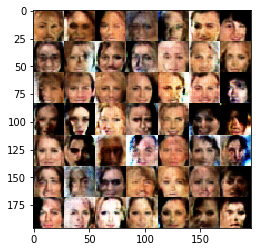

Epoch 1/2... Discriminator Loss: 1.3468... Generator Loss: 0.8126
Epoch 1/2... Discriminator Loss: 1.5128... Generator Loss: 0.6695
Epoch 1/2... Discriminator Loss: 1.3555... Generator Loss: 0.6837
Epoch 1/2... Discriminator Loss: 1.4223... Generator Loss: 0.7507
Epoch 1/2... Discriminator Loss: 1.3538... Generator Loss: 0.7333
Epoch 1/2... Discriminator Loss: 1.4479... Generator Loss: 0.7283
Epoch 1/2... Discriminator Loss: 1.3329... Generator Loss: 0.8400
Epoch 1/2... Discriminator Loss: 1.3746... Generator Loss: 0.8135
Epoch 1/2... Discriminator Loss: 1.4112... Generator Loss: 0.8888
Epoch 1/2... Discriminator Loss: 1.3976... Generator Loss: 0.8584


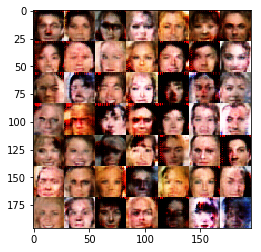

Epoch 1/2... Discriminator Loss: 1.3665... Generator Loss: 0.7787
Epoch 1/2... Discriminator Loss: 1.4934... Generator Loss: 0.5190
Epoch 1/2... Discriminator Loss: 1.4460... Generator Loss: 0.6090
Epoch 1/2... Discriminator Loss: 1.3442... Generator Loss: 0.9873
Epoch 1/2... Discriminator Loss: 1.4615... Generator Loss: 0.6741
Epoch 1/2... Discriminator Loss: 1.2924... Generator Loss: 0.6946
Epoch 1/2... Discriminator Loss: 1.3921... Generator Loss: 0.7096
Epoch 1/2... Discriminator Loss: 1.4184... Generator Loss: 0.9278
Epoch 1/2... Discriminator Loss: 1.3549... Generator Loss: 0.7020
Epoch 1/2... Discriminator Loss: 1.3987... Generator Loss: 0.8653


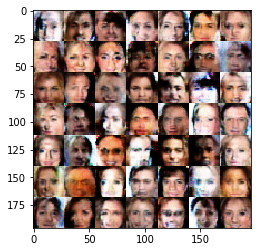

Epoch 1/2... Discriminator Loss: 1.4573... Generator Loss: 0.4969
Epoch 1/2... Discriminator Loss: 1.3819... Generator Loss: 0.8104
Epoch 1/2... Discriminator Loss: 1.3116... Generator Loss: 0.6955
Epoch 1/2... Discriminator Loss: 1.3315... Generator Loss: 0.8173
Epoch 1/2... Discriminator Loss: 1.4387... Generator Loss: 0.6229
Epoch 1/2... Discriminator Loss: 1.3860... Generator Loss: 0.7439
Epoch 1/2... Discriminator Loss: 1.3379... Generator Loss: 0.6472
Epoch 1/2... Discriminator Loss: 1.3975... Generator Loss: 0.8667
Epoch 1/2... Discriminator Loss: 1.3062... Generator Loss: 0.7477
Epoch 1/2... Discriminator Loss: 1.3352... Generator Loss: 1.0049


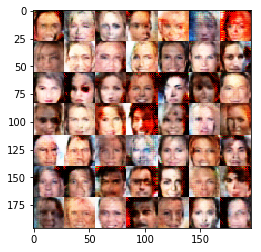

Epoch 1/2... Discriminator Loss: 1.4425... Generator Loss: 0.8952
Epoch 1/2... Discriminator Loss: 1.3693... Generator Loss: 0.6104
Epoch 1/2... Discriminator Loss: 1.4228... Generator Loss: 0.7225
Epoch 1/2... Discriminator Loss: 1.3374... Generator Loss: 0.8851
Epoch 1/2... Discriminator Loss: 1.4630... Generator Loss: 0.6519
Epoch 1/2... Discriminator Loss: 1.3899... Generator Loss: 0.8335
Epoch 1/2... Discriminator Loss: 1.3843... Generator Loss: 0.9392
Epoch 1/2... Discriminator Loss: 1.3353... Generator Loss: 0.7553
Epoch 1/2... Discriminator Loss: 1.3115... Generator Loss: 0.9346
Epoch 1/2... Discriminator Loss: 1.3558... Generator Loss: 0.7385


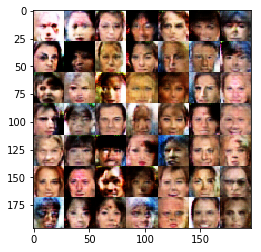

Epoch 1/2... Discriminator Loss: 1.3186... Generator Loss: 0.8317
Epoch 1/2... Discriminator Loss: 1.4589... Generator Loss: 0.5318
Epoch 1/2... Discriminator Loss: 1.3177... Generator Loss: 0.6987
Epoch 1/2... Discriminator Loss: 1.4045... Generator Loss: 0.6977
Epoch 1/2... Discriminator Loss: 1.3696... Generator Loss: 0.6031
Epoch 1/2... Discriminator Loss: 1.2030... Generator Loss: 0.6685
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.7828
Epoch 1/2... Discriminator Loss: 1.4584... Generator Loss: 0.7037
Epoch 1/2... Discriminator Loss: 1.2946... Generator Loss: 0.8001
Epoch 1/2... Discriminator Loss: 1.3848... Generator Loss: 0.6590


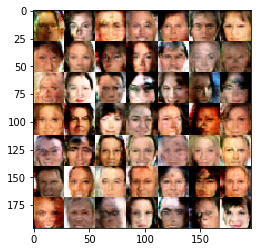

Epoch 1/2... Discriminator Loss: 1.1930... Generator Loss: 0.7765
Epoch 1/2... Discriminator Loss: 1.2931... Generator Loss: 0.8519
Epoch 1/2... Discriminator Loss: 1.4176... Generator Loss: 0.9659
Epoch 1/2... Discriminator Loss: 1.3337... Generator Loss: 0.8971
Epoch 1/2... Discriminator Loss: 1.4544... Generator Loss: 0.5940
Epoch 1/2... Discriminator Loss: 1.3192... Generator Loss: 0.7477
Epoch 1/2... Discriminator Loss: 1.4410... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 1.2781... Generator Loss: 0.7041
Epoch 1/2... Discriminator Loss: 1.3736... Generator Loss: 0.9348
Epoch 1/2... Discriminator Loss: 1.3571... Generator Loss: 0.8816


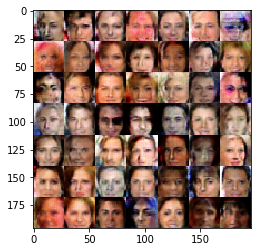

Epoch 1/2... Discriminator Loss: 1.3646... Generator Loss: 0.8216
Epoch 1/2... Discriminator Loss: 1.3496... Generator Loss: 0.8318
Epoch 1/2... Discriminator Loss: 1.4252... Generator Loss: 0.9410
Epoch 1/2... Discriminator Loss: 1.3254... Generator Loss: 0.8151
Epoch 1/2... Discriminator Loss: 1.4278... Generator Loss: 0.7869
Epoch 1/2... Discriminator Loss: 1.3226... Generator Loss: 1.0306
Epoch 1/2... Discriminator Loss: 1.2305... Generator Loss: 0.7178
Epoch 1/2... Discriminator Loss: 1.4766... Generator Loss: 0.9501
Epoch 1/2... Discriminator Loss: 1.3739... Generator Loss: 0.8832
Epoch 1/2... Discriminator Loss: 1.3097... Generator Loss: 0.7491


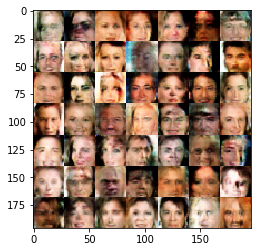

Epoch 1/2... Discriminator Loss: 1.5755... Generator Loss: 0.4936
Epoch 1/2... Discriminator Loss: 1.4221... Generator Loss: 0.5640
Epoch 1/2... Discriminator Loss: 1.3983... Generator Loss: 0.6761
Epoch 1/2... Discriminator Loss: 1.3959... Generator Loss: 0.6498
Epoch 1/2... Discriminator Loss: 1.3329... Generator Loss: 0.8906
Epoch 1/2... Discriminator Loss: 1.2535... Generator Loss: 0.8775
Epoch 1/2... Discriminator Loss: 1.2948... Generator Loss: 0.7277
Epoch 1/2... Discriminator Loss: 1.4190... Generator Loss: 0.9975
Epoch 1/2... Discriminator Loss: 1.3181... Generator Loss: 0.8228
Epoch 1/2... Discriminator Loss: 1.3378... Generator Loss: 0.7877


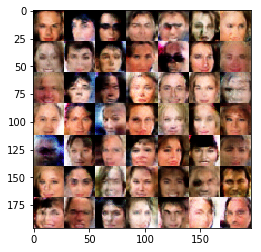

Epoch 1/2... Discriminator Loss: 1.4252... Generator Loss: 0.8511
Epoch 1/2... Discriminator Loss: 1.2900... Generator Loss: 0.6081
Epoch 1/2... Discriminator Loss: 1.4864... Generator Loss: 0.6620
Epoch 1/2... Discriminator Loss: 1.3453... Generator Loss: 1.0058
Epoch 1/2... Discriminator Loss: 1.4233... Generator Loss: 0.6294
Epoch 1/2... Discriminator Loss: 1.3544... Generator Loss: 0.6544
Epoch 1/2... Discriminator Loss: 1.3605... Generator Loss: 0.7291
Epoch 1/2... Discriminator Loss: 1.3041... Generator Loss: 0.8907
Epoch 1/2... Discriminator Loss: 1.5218... Generator Loss: 0.5152
Epoch 1/2... Discriminator Loss: 1.4320... Generator Loss: 0.6672


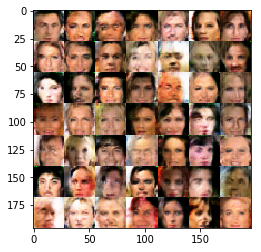

Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 1.0375
Epoch 1/2... Discriminator Loss: 1.3146... Generator Loss: 0.8844
Epoch 1/2... Discriminator Loss: 1.3936... Generator Loss: 0.7119
Epoch 1/2... Discriminator Loss: 1.4245... Generator Loss: 1.0477
Epoch 1/2... Discriminator Loss: 1.3322... Generator Loss: 0.8811
Epoch 1/2... Discriminator Loss: 1.4352... Generator Loss: 0.5944
Epoch 1/2... Discriminator Loss: 1.3946... Generator Loss: 0.8056
Epoch 1/2... Discriminator Loss: 1.3316... Generator Loss: 0.6946
Epoch 1/2... Discriminator Loss: 1.2845... Generator Loss: 0.6985
Epoch 1/2... Discriminator Loss: 1.3138... Generator Loss: 0.7555


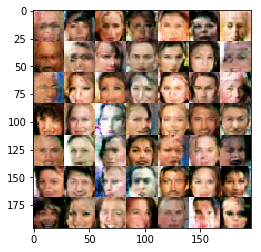

Epoch 1/2... Discriminator Loss: 1.3963... Generator Loss: 0.7753
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.7789
Epoch 1/2... Discriminator Loss: 1.3173... Generator Loss: 0.8567
Epoch 1/2... Discriminator Loss: 1.3761... Generator Loss: 0.7348
Epoch 1/2... Discriminator Loss: 1.3653... Generator Loss: 0.6697
Epoch 1/2... Discriminator Loss: 1.2874... Generator Loss: 0.7969
Epoch 1/2... Discriminator Loss: 1.3572... Generator Loss: 0.6219
Epoch 1/2... Discriminator Loss: 1.3627... Generator Loss: 0.7734
Epoch 1/2... Discriminator Loss: 1.3911... Generator Loss: 0.8772
Epoch 1/2... Discriminator Loss: 1.4389... Generator Loss: 0.5473


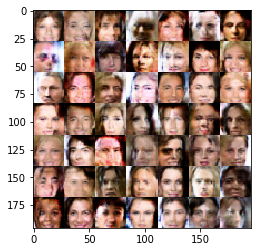

Epoch 1/2... Discriminator Loss: 1.4079... Generator Loss: 0.6250
Epoch 1/2... Discriminator Loss: 1.3683... Generator Loss: 0.6976
Epoch 1/2... Discriminator Loss: 1.4048... Generator Loss: 1.0222
Epoch 1/2... Discriminator Loss: 1.3429... Generator Loss: 0.7455
Epoch 1/2... Discriminator Loss: 1.3671... Generator Loss: 0.8451
Epoch 1/2... Discriminator Loss: 1.3797... Generator Loss: 0.8418
Epoch 1/2... Discriminator Loss: 1.2707... Generator Loss: 0.8966
Epoch 1/2... Discriminator Loss: 1.3135... Generator Loss: 1.0329
Epoch 1/2... Discriminator Loss: 1.4227... Generator Loss: 0.6250
Epoch 1/2... Discriminator Loss: 1.5111... Generator Loss: 0.9992


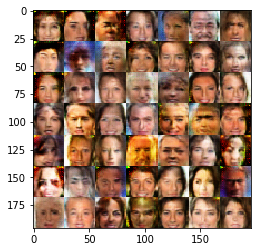

Epoch 1/2... Discriminator Loss: 1.3140... Generator Loss: 0.9427
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.8136
Epoch 1/2... Discriminator Loss: 1.5726... Generator Loss: 0.5678
Epoch 1/2... Discriminator Loss: 1.3694... Generator Loss: 0.9042
Epoch 1/2... Discriminator Loss: 1.4118... Generator Loss: 0.6747
Epoch 1/2... Discriminator Loss: 1.3423... Generator Loss: 0.6377
Epoch 1/2... Discriminator Loss: 1.3915... Generator Loss: 0.7774
Epoch 1/2... Discriminator Loss: 1.3478... Generator Loss: 0.8972
Epoch 1/2... Discriminator Loss: 1.3208... Generator Loss: 0.6660
Epoch 1/2... Discriminator Loss: 1.3234... Generator Loss: 0.8649


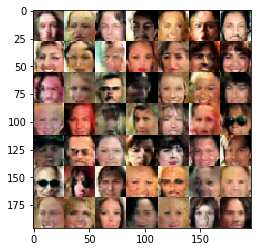

Epoch 1/2... Discriminator Loss: 1.2340... Generator Loss: 0.7730
Epoch 1/2... Discriminator Loss: 1.3296... Generator Loss: 0.8705
Epoch 1/2... Discriminator Loss: 1.3281... Generator Loss: 0.7089
Epoch 1/2... Discriminator Loss: 1.3355... Generator Loss: 0.7656
Epoch 1/2... Discriminator Loss: 1.3756... Generator Loss: 0.8381
Epoch 1/2... Discriminator Loss: 1.2733... Generator Loss: 0.7097
Epoch 1/2... Discriminator Loss: 1.4302... Generator Loss: 0.6279
Epoch 1/2... Discriminator Loss: 1.3421... Generator Loss: 0.6669
Epoch 1/2... Discriminator Loss: 1.3147... Generator Loss: 0.8684
Epoch 1/2... Discriminator Loss: 1.4291... Generator Loss: 1.0066


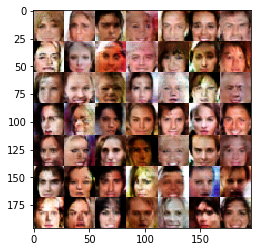

Epoch 1/2... Discriminator Loss: 1.4595... Generator Loss: 0.4658
Epoch 1/2... Discriminator Loss: 1.3362... Generator Loss: 0.8410
Epoch 1/2... Discriminator Loss: 1.3067... Generator Loss: 0.9106
Epoch 1/2... Discriminator Loss: 1.3459... Generator Loss: 0.7202
Epoch 1/2... Discriminator Loss: 1.3021... Generator Loss: 0.8606
Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.6769
Epoch 1/2... Discriminator Loss: 1.3712... Generator Loss: 0.8743
Epoch 1/2... Discriminator Loss: 1.3702... Generator Loss: 0.8760
Epoch 1/2... Discriminator Loss: 1.4687... Generator Loss: 0.8702
Epoch 1/2... Discriminator Loss: 1.3000... Generator Loss: 0.8244


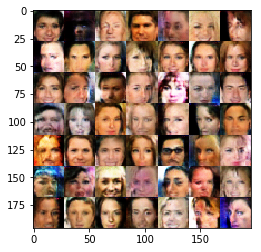

Epoch 1/2... Discriminator Loss: 1.3292... Generator Loss: 0.7886
Epoch 1/2... Discriminator Loss: 1.4617... Generator Loss: 0.6169
Epoch 1/2... Discriminator Loss: 1.3020... Generator Loss: 0.9126
Epoch 1/2... Discriminator Loss: 1.4400... Generator Loss: 1.0040
Epoch 1/2... Discriminator Loss: 1.3767... Generator Loss: 0.7774
Epoch 1/2... Discriminator Loss: 1.4368... Generator Loss: 0.5370
Epoch 1/2... Discriminator Loss: 1.3467... Generator Loss: 0.9013
Epoch 1/2... Discriminator Loss: 1.3451... Generator Loss: 1.1877
Epoch 1/2... Discriminator Loss: 1.2717... Generator Loss: 0.7513
Epoch 1/2... Discriminator Loss: 1.5761... Generator Loss: 0.4691


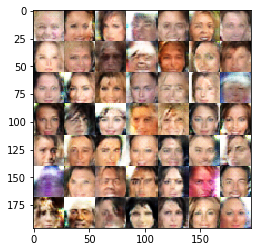

Epoch 1/2... Discriminator Loss: 1.2561... Generator Loss: 1.0315
Epoch 1/2... Discriminator Loss: 1.4236... Generator Loss: 1.1991
Epoch 1/2... Discriminator Loss: 1.1799... Generator Loss: 1.0057
Epoch 1/2... Discriminator Loss: 1.2165... Generator Loss: 0.9007
Epoch 1/2... Discriminator Loss: 1.6793... Generator Loss: 0.4976
Epoch 1/2... Discriminator Loss: 1.3319... Generator Loss: 0.8351
Epoch 1/2... Discriminator Loss: 1.3002... Generator Loss: 0.8741
Epoch 1/2... Discriminator Loss: 1.3525... Generator Loss: 0.7815
Epoch 1/2... Discriminator Loss: 1.2147... Generator Loss: 0.6433
Epoch 1/2... Discriminator Loss: 1.4057... Generator Loss: 1.0321


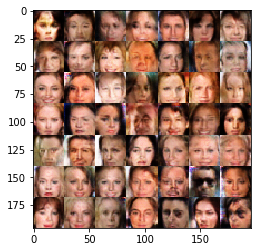

Epoch 1/2... Discriminator Loss: 1.2879... Generator Loss: 1.0963
Epoch 1/2... Discriminator Loss: 1.3088... Generator Loss: 0.5818
Epoch 1/2... Discriminator Loss: 1.2615... Generator Loss: 1.1250
Epoch 1/2... Discriminator Loss: 1.0231... Generator Loss: 1.1375
Epoch 1/2... Discriminator Loss: 1.3236... Generator Loss: 0.8218
Epoch 1/2... Discriminator Loss: 1.2374... Generator Loss: 0.7870
Epoch 1/2... Discriminator Loss: 1.4688... Generator Loss: 0.5451
Epoch 1/2... Discriminator Loss: 1.1260... Generator Loss: 1.1189
Epoch 1/2... Discriminator Loss: 1.3581... Generator Loss: 0.8586
Epoch 1/2... Discriminator Loss: 1.3897... Generator Loss: 0.6323


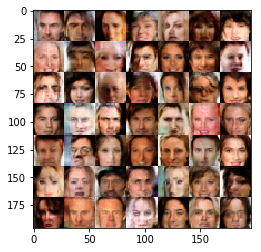

Epoch 1/2... Discriminator Loss: 1.3344... Generator Loss: 0.6497
Epoch 1/2... Discriminator Loss: 1.2574... Generator Loss: 0.8576
Epoch 1/2... Discriminator Loss: 1.2564... Generator Loss: 0.7437
Epoch 1/2... Discriminator Loss: 1.4589... Generator Loss: 0.5934
Epoch 1/2... Discriminator Loss: 1.4633... Generator Loss: 0.5701
Epoch 1/2... Discriminator Loss: 1.3024... Generator Loss: 0.8643
Epoch 1/2... Discriminator Loss: 1.3077... Generator Loss: 0.6934
Epoch 1/2... Discriminator Loss: 1.3543... Generator Loss: 0.7185
Epoch 1/2... Discriminator Loss: 1.3431... Generator Loss: 0.7619
Epoch 1/2... Discriminator Loss: 1.4843... Generator Loss: 0.4987


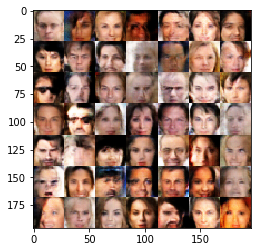

Epoch 1/2... Discriminator Loss: 1.3895... Generator Loss: 0.8101
Epoch 1/2... Discriminator Loss: 1.3174... Generator Loss: 0.6301
Epoch 1/2... Discriminator Loss: 1.3186... Generator Loss: 0.8418
Epoch 1/2... Discriminator Loss: 1.3784... Generator Loss: 0.9204
Epoch 1/2... Discriminator Loss: 1.3570... Generator Loss: 0.8531
Epoch 1/2... Discriminator Loss: 1.3341... Generator Loss: 0.6844
Epoch 1/2... Discriminator Loss: 1.2663... Generator Loss: 0.7824
Epoch 1/2... Discriminator Loss: 1.3636... Generator Loss: 0.8275
Epoch 1/2... Discriminator Loss: 1.3635... Generator Loss: 0.7577
Epoch 1/2... Discriminator Loss: 1.2783... Generator Loss: 0.8241


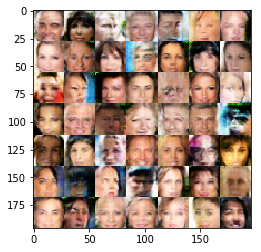

Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.8564
Epoch 1/2... Discriminator Loss: 1.3362... Generator Loss: 0.8149
Epoch 1/2... Discriminator Loss: 1.3513... Generator Loss: 0.8688
Epoch 1/2... Discriminator Loss: 1.3299... Generator Loss: 0.8159
Epoch 1/2... Discriminator Loss: 1.3323... Generator Loss: 1.0252
Epoch 1/2... Discriminator Loss: 1.3784... Generator Loss: 0.7475
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 0.8386
Epoch 1/2... Discriminator Loss: 1.3219... Generator Loss: 0.8553
Epoch 1/2... Discriminator Loss: 1.2980... Generator Loss: 0.7888
Epoch 1/2... Discriminator Loss: 1.3280... Generator Loss: 0.9445


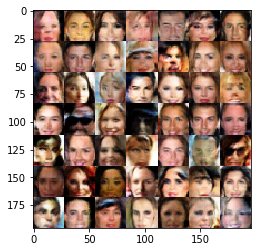

Epoch 1/2... Discriminator Loss: 1.2794... Generator Loss: 0.7182
Epoch 1/2... Discriminator Loss: 1.3192... Generator Loss: 0.8592
Epoch 1/2... Discriminator Loss: 1.5266... Generator Loss: 0.6936
Epoch 1/2... Discriminator Loss: 1.2926... Generator Loss: 0.8504
Epoch 1/2... Discriminator Loss: 1.3883... Generator Loss: 0.8570
Epoch 1/2... Discriminator Loss: 1.3305... Generator Loss: 0.8274
Epoch 2/2... Discriminator Loss: 1.2713... Generator Loss: 0.7700
Epoch 2/2... Discriminator Loss: 1.3409... Generator Loss: 0.9195
Epoch 2/2... Discriminator Loss: 1.3828... Generator Loss: 1.1221
Epoch 2/2... Discriminator Loss: 1.3805... Generator Loss: 0.7589


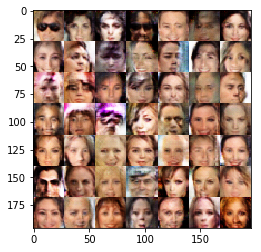

Epoch 2/2... Discriminator Loss: 1.3940... Generator Loss: 0.6676
Epoch 2/2... Discriminator Loss: 1.3783... Generator Loss: 0.7874
Epoch 2/2... Discriminator Loss: 1.4931... Generator Loss: 0.5388
Epoch 2/2... Discriminator Loss: 1.4067... Generator Loss: 0.7458
Epoch 2/2... Discriminator Loss: 1.3301... Generator Loss: 0.9102
Epoch 2/2... Discriminator Loss: 1.3631... Generator Loss: 0.7847
Epoch 2/2... Discriminator Loss: 1.3036... Generator Loss: 0.7690
Epoch 2/2... Discriminator Loss: 1.3952... Generator Loss: 0.9184
Epoch 2/2... Discriminator Loss: 1.3161... Generator Loss: 0.8488
Epoch 2/2... Discriminator Loss: 1.3473... Generator Loss: 0.8510


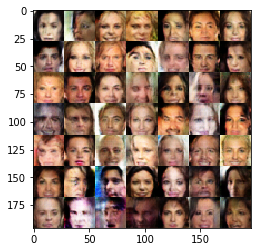

Epoch 2/2... Discriminator Loss: 1.3742... Generator Loss: 0.5883
Epoch 2/2... Discriminator Loss: 1.3251... Generator Loss: 0.7502
Epoch 2/2... Discriminator Loss: 1.3390... Generator Loss: 0.9640
Epoch 2/2... Discriminator Loss: 1.3505... Generator Loss: 0.6843
Epoch 2/2... Discriminator Loss: 1.3238... Generator Loss: 0.7073
Epoch 2/2... Discriminator Loss: 1.2902... Generator Loss: 0.6745
Epoch 2/2... Discriminator Loss: 1.4359... Generator Loss: 0.6641
Epoch 2/2... Discriminator Loss: 1.3434... Generator Loss: 0.7852
Epoch 2/2... Discriminator Loss: 1.4057... Generator Loss: 0.8111
Epoch 2/2... Discriminator Loss: 1.3206... Generator Loss: 0.7009


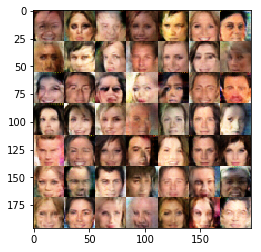

Epoch 2/2... Discriminator Loss: 1.3511... Generator Loss: 0.7441
Epoch 2/2... Discriminator Loss: 1.3708... Generator Loss: 0.8910
Epoch 2/2... Discriminator Loss: 1.3842... Generator Loss: 0.7742
Epoch 2/2... Discriminator Loss: 1.2834... Generator Loss: 0.6177
Epoch 2/2... Discriminator Loss: 1.3732... Generator Loss: 0.6926
Epoch 2/2... Discriminator Loss: 1.3291... Generator Loss: 0.9904
Epoch 2/2... Discriminator Loss: 1.3374... Generator Loss: 0.7770
Epoch 2/2... Discriminator Loss: 1.5676... Generator Loss: 0.5151
Epoch 2/2... Discriminator Loss: 1.3760... Generator Loss: 0.8608
Epoch 2/2... Discriminator Loss: 1.3492... Generator Loss: 0.9448


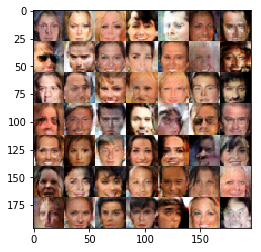

Epoch 2/2... Discriminator Loss: 1.3681... Generator Loss: 0.8286
Epoch 2/2... Discriminator Loss: 1.3574... Generator Loss: 0.8032
Epoch 2/2... Discriminator Loss: 1.3453... Generator Loss: 0.9245
Epoch 2/2... Discriminator Loss: 1.5424... Generator Loss: 0.7189
Epoch 2/2... Discriminator Loss: 1.3132... Generator Loss: 0.6687
Epoch 2/2... Discriminator Loss: 1.3345... Generator Loss: 0.7021
Epoch 2/2... Discriminator Loss: 1.2476... Generator Loss: 0.6638
Epoch 2/2... Discriminator Loss: 1.1303... Generator Loss: 0.7196
Epoch 2/2... Discriminator Loss: 1.4025... Generator Loss: 0.6603
Epoch 2/2... Discriminator Loss: 1.2656... Generator Loss: 0.7609


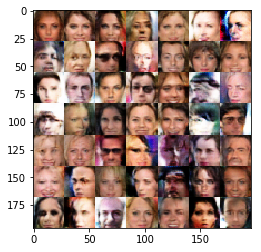

Epoch 2/2... Discriminator Loss: 1.3117... Generator Loss: 0.7131
Epoch 2/2... Discriminator Loss: 1.3258... Generator Loss: 0.9081
Epoch 2/2... Discriminator Loss: 1.3708... Generator Loss: 0.7453
Epoch 2/2... Discriminator Loss: 1.3806... Generator Loss: 1.0088
Epoch 2/2... Discriminator Loss: 1.3340... Generator Loss: 0.7788
Epoch 2/2... Discriminator Loss: 1.3355... Generator Loss: 0.6278
Epoch 2/2... Discriminator Loss: 1.3884... Generator Loss: 0.8266
Epoch 2/2... Discriminator Loss: 1.4491... Generator Loss: 0.6794
Epoch 2/2... Discriminator Loss: 1.3735... Generator Loss: 0.8356
Epoch 2/2... Discriminator Loss: 1.4832... Generator Loss: 0.4827


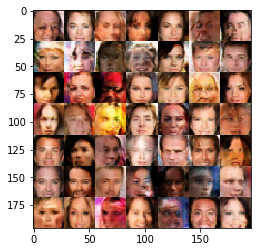

Epoch 2/2... Discriminator Loss: 1.4085... Generator Loss: 0.7467
Epoch 2/2... Discriminator Loss: 1.3136... Generator Loss: 0.8136
Epoch 2/2... Discriminator Loss: 1.4088... Generator Loss: 1.0864
Epoch 2/2... Discriminator Loss: 1.3115... Generator Loss: 0.8796
Epoch 2/2... Discriminator Loss: 1.3303... Generator Loss: 0.8799
Epoch 2/2... Discriminator Loss: 1.1887... Generator Loss: 1.0366
Epoch 2/2... Discriminator Loss: 1.3355... Generator Loss: 0.8226
Epoch 2/2... Discriminator Loss: 1.3371... Generator Loss: 0.8411
Epoch 2/2... Discriminator Loss: 1.2471... Generator Loss: 0.6760
Epoch 2/2... Discriminator Loss: 1.5302... Generator Loss: 0.4446


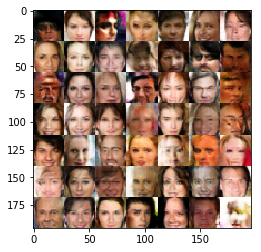

Epoch 2/2... Discriminator Loss: 1.2758... Generator Loss: 0.9181
Epoch 2/2... Discriminator Loss: 1.4812... Generator Loss: 0.7972
Epoch 2/2... Discriminator Loss: 1.3455... Generator Loss: 0.8504
Epoch 2/2... Discriminator Loss: 1.3369... Generator Loss: 0.6944
Epoch 2/2... Discriminator Loss: 1.5042... Generator Loss: 0.5314
Epoch 2/2... Discriminator Loss: 1.3789... Generator Loss: 0.8076
Epoch 2/2... Discriminator Loss: 1.2470... Generator Loss: 0.7198
Epoch 2/2... Discriminator Loss: 1.3631... Generator Loss: 0.7110
Epoch 2/2... Discriminator Loss: 1.3235... Generator Loss: 0.6378
Epoch 2/2... Discriminator Loss: 1.3675... Generator Loss: 0.6421


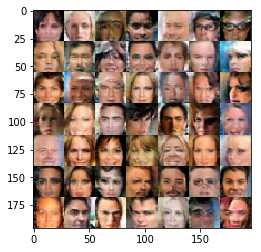

Epoch 2/2... Discriminator Loss: 1.3092... Generator Loss: 0.9773
Epoch 2/2... Discriminator Loss: 1.3586... Generator Loss: 0.9290
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 0.8080
Epoch 2/2... Discriminator Loss: 1.2515... Generator Loss: 0.7551
Epoch 2/2... Discriminator Loss: 1.3847... Generator Loss: 0.8550
Epoch 2/2... Discriminator Loss: 1.3233... Generator Loss: 0.7306
Epoch 2/2... Discriminator Loss: 1.3649... Generator Loss: 0.7743
Epoch 2/2... Discriminator Loss: 1.4890... Generator Loss: 1.3195
Epoch 2/2... Discriminator Loss: 1.3675... Generator Loss: 0.9333
Epoch 2/2... Discriminator Loss: 1.3495... Generator Loss: 0.8178


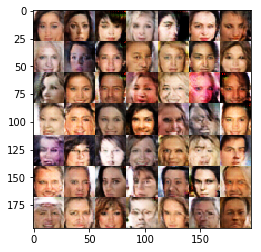

Epoch 2/2... Discriminator Loss: 1.3126... Generator Loss: 0.7610
Epoch 2/2... Discriminator Loss: 1.3044... Generator Loss: 0.8229
Epoch 2/2... Discriminator Loss: 1.3288... Generator Loss: 0.8168
Epoch 2/2... Discriminator Loss: 1.3825... Generator Loss: 0.6804
Epoch 2/2... Discriminator Loss: 1.3165... Generator Loss: 0.8165
Epoch 2/2... Discriminator Loss: 1.3531... Generator Loss: 0.7973
Epoch 2/2... Discriminator Loss: 1.4234... Generator Loss: 0.7513
Epoch 2/2... Discriminator Loss: 1.3128... Generator Loss: 0.7572
Epoch 2/2... Discriminator Loss: 1.2660... Generator Loss: 0.8531
Epoch 2/2... Discriminator Loss: 1.5369... Generator Loss: 0.5258


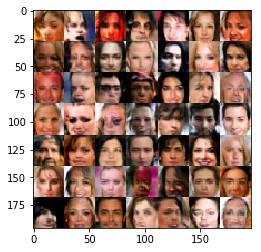

Epoch 2/2... Discriminator Loss: 1.2777... Generator Loss: 0.7874
Epoch 2/2... Discriminator Loss: 1.2537... Generator Loss: 0.7196
Epoch 2/2... Discriminator Loss: 1.3569... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 1.2847... Generator Loss: 0.8211
Epoch 2/2... Discriminator Loss: 1.3467... Generator Loss: 0.8266
Epoch 2/2... Discriminator Loss: 1.2548... Generator Loss: 0.8840
Epoch 2/2... Discriminator Loss: 1.3531... Generator Loss: 0.9127
Epoch 2/2... Discriminator Loss: 1.2956... Generator Loss: 0.7377
Epoch 2/2... Discriminator Loss: 1.3581... Generator Loss: 0.9966
Epoch 2/2... Discriminator Loss: 1.3336... Generator Loss: 0.8610


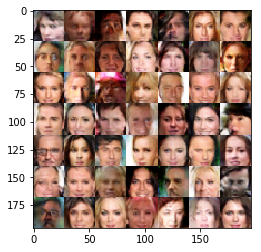

Epoch 2/2... Discriminator Loss: 1.3423... Generator Loss: 0.6951
Epoch 2/2... Discriminator Loss: 1.4812... Generator Loss: 0.6838
Epoch 2/2... Discriminator Loss: 1.3079... Generator Loss: 0.7301
Epoch 2/2... Discriminator Loss: 1.2881... Generator Loss: 0.7011
Epoch 2/2... Discriminator Loss: 1.3754... Generator Loss: 0.9941
Epoch 2/2... Discriminator Loss: 1.4464... Generator Loss: 0.4996
Epoch 2/2... Discriminator Loss: 1.3333... Generator Loss: 0.8078
Epoch 2/2... Discriminator Loss: 1.2771... Generator Loss: 0.7813
Epoch 2/2... Discriminator Loss: 1.4706... Generator Loss: 0.7648
Epoch 2/2... Discriminator Loss: 1.3026... Generator Loss: 0.8403


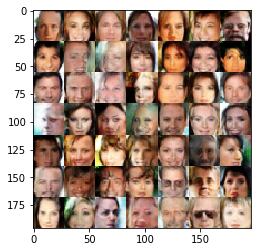

Epoch 2/2... Discriminator Loss: 1.2430... Generator Loss: 0.7851
Epoch 2/2... Discriminator Loss: 1.2949... Generator Loss: 0.7197
Epoch 2/2... Discriminator Loss: 1.3572... Generator Loss: 0.5865
Epoch 2/2... Discriminator Loss: 1.4273... Generator Loss: 0.6098
Epoch 2/2... Discriminator Loss: 1.3423... Generator Loss: 0.9641
Epoch 2/2... Discriminator Loss: 1.2864... Generator Loss: 0.7001
Epoch 2/2... Discriminator Loss: 1.2944... Generator Loss: 0.7514
Epoch 2/2... Discriminator Loss: 1.3996... Generator Loss: 0.7974
Epoch 2/2... Discriminator Loss: 1.3126... Generator Loss: 0.8892
Epoch 2/2... Discriminator Loss: 1.3993... Generator Loss: 0.8634


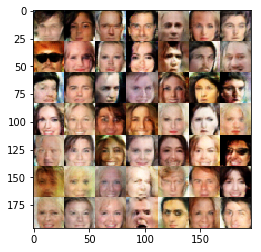

Epoch 2/2... Discriminator Loss: 1.3209... Generator Loss: 0.7726
Epoch 2/2... Discriminator Loss: 1.3910... Generator Loss: 0.8014
Epoch 2/2... Discriminator Loss: 1.1646... Generator Loss: 0.6974
Epoch 2/2... Discriminator Loss: 1.3549... Generator Loss: 0.7620
Epoch 2/2... Discriminator Loss: 1.2765... Generator Loss: 0.8980
Epoch 2/2... Discriminator Loss: 1.3018... Generator Loss: 0.8197
Epoch 2/2... Discriminator Loss: 1.3535... Generator Loss: 0.9423
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.8299
Epoch 2/2... Discriminator Loss: 1.3539... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 1.3802... Generator Loss: 0.7806


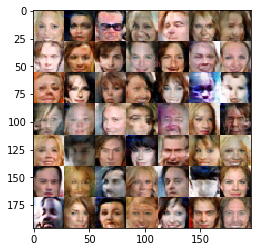

Epoch 2/2... Discriminator Loss: 1.2120... Generator Loss: 0.6499
Epoch 2/2... Discriminator Loss: 1.2933... Generator Loss: 0.8674
Epoch 2/2... Discriminator Loss: 1.3246... Generator Loss: 0.8240
Epoch 2/2... Discriminator Loss: 1.3349... Generator Loss: 0.9666
Epoch 2/2... Discriminator Loss: 1.3314... Generator Loss: 0.6798
Epoch 2/2... Discriminator Loss: 1.4312... Generator Loss: 0.5783
Epoch 2/2... Discriminator Loss: 1.3622... Generator Loss: 0.8893
Epoch 2/2... Discriminator Loss: 1.3495... Generator Loss: 0.8172
Epoch 2/2... Discriminator Loss: 1.2850... Generator Loss: 0.8855
Epoch 2/2... Discriminator Loss: 1.3154... Generator Loss: 0.7225


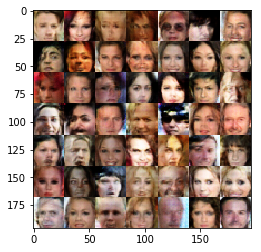

Epoch 2/2... Discriminator Loss: 1.3655... Generator Loss: 0.9736
Epoch 2/2... Discriminator Loss: 1.3149... Generator Loss: 0.7305
Epoch 2/2... Discriminator Loss: 1.4161... Generator Loss: 0.6859
Epoch 2/2... Discriminator Loss: 1.3026... Generator Loss: 0.7720
Epoch 2/2... Discriminator Loss: 1.3628... Generator Loss: 0.8056
Epoch 2/2... Discriminator Loss: 1.3139... Generator Loss: 0.7280
Epoch 2/2... Discriminator Loss: 1.4166... Generator Loss: 0.6564
Epoch 2/2... Discriminator Loss: 1.3486... Generator Loss: 0.8121
Epoch 2/2... Discriminator Loss: 1.3628... Generator Loss: 0.6151
Epoch 2/2... Discriminator Loss: 1.3059... Generator Loss: 0.8427


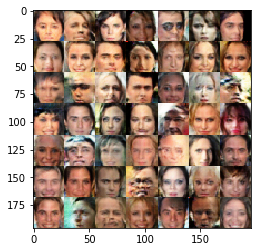

Epoch 2/2... Discriminator Loss: 1.3052... Generator Loss: 1.0742
Epoch 2/2... Discriminator Loss: 1.4157... Generator Loss: 0.5866
Epoch 2/2... Discriminator Loss: 1.3564... Generator Loss: 0.8026
Epoch 2/2... Discriminator Loss: 1.3494... Generator Loss: 0.7953
Epoch 2/2... Discriminator Loss: 1.2900... Generator Loss: 0.6864
Epoch 2/2... Discriminator Loss: 1.2373... Generator Loss: 0.8307
Epoch 2/2... Discriminator Loss: 1.2983... Generator Loss: 0.7086
Epoch 2/2... Discriminator Loss: 1.3652... Generator Loss: 0.7774
Epoch 2/2... Discriminator Loss: 1.3658... Generator Loss: 0.9645
Epoch 2/2... Discriminator Loss: 1.2873... Generator Loss: 0.7240


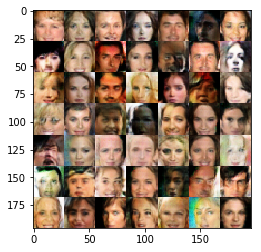

Epoch 2/2... Discriminator Loss: 1.3274... Generator Loss: 0.7100
Epoch 2/2... Discriminator Loss: 1.5132... Generator Loss: 0.4972
Epoch 2/2... Discriminator Loss: 1.2829... Generator Loss: 0.8346
Epoch 2/2... Discriminator Loss: 1.3130... Generator Loss: 0.8740
Epoch 2/2... Discriminator Loss: 1.3554... Generator Loss: 0.7372
Epoch 2/2... Discriminator Loss: 1.3626... Generator Loss: 0.9368
Epoch 2/2... Discriminator Loss: 1.3413... Generator Loss: 0.9170
Epoch 2/2... Discriminator Loss: 1.3279... Generator Loss: 0.7990
Epoch 2/2... Discriminator Loss: 1.3093... Generator Loss: 0.7639
Epoch 2/2... Discriminator Loss: 1.3905... Generator Loss: 0.8861


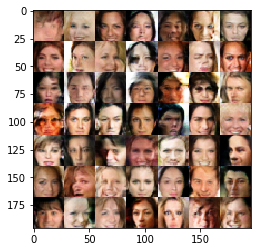

Epoch 2/2... Discriminator Loss: 1.3843... Generator Loss: 0.8988
Epoch 2/2... Discriminator Loss: 1.3085... Generator Loss: 0.9417
Epoch 2/2... Discriminator Loss: 1.3291... Generator Loss: 0.7247
Epoch 2/2... Discriminator Loss: 1.3644... Generator Loss: 0.6576
Epoch 2/2... Discriminator Loss: 1.3650... Generator Loss: 0.9680
Epoch 2/2... Discriminator Loss: 1.1804... Generator Loss: 0.7934
Epoch 2/2... Discriminator Loss: 1.3321... Generator Loss: 0.7682
Epoch 2/2... Discriminator Loss: 1.2870... Generator Loss: 0.8025
Epoch 2/2... Discriminator Loss: 1.3467... Generator Loss: 0.9801
Epoch 2/2... Discriminator Loss: 1.2824... Generator Loss: 0.7176


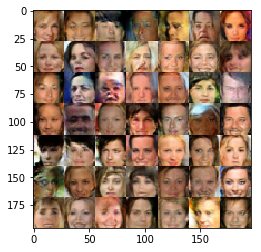

Epoch 2/2... Discriminator Loss: 1.2822... Generator Loss: 0.6565
Epoch 2/2... Discriminator Loss: 1.3706... Generator Loss: 0.6132
Epoch 2/2... Discriminator Loss: 1.2820... Generator Loss: 0.8437
Epoch 2/2... Discriminator Loss: 1.3426... Generator Loss: 0.6814
Epoch 2/2... Discriminator Loss: 1.3239... Generator Loss: 0.7137
Epoch 2/2... Discriminator Loss: 1.3741... Generator Loss: 0.8724
Epoch 2/2... Discriminator Loss: 1.2280... Generator Loss: 0.8838
Epoch 2/2... Discriminator Loss: 1.3355... Generator Loss: 0.9761
Epoch 2/2... Discriminator Loss: 1.3600... Generator Loss: 0.9138
Epoch 2/2... Discriminator Loss: 1.4012... Generator Loss: 0.6923


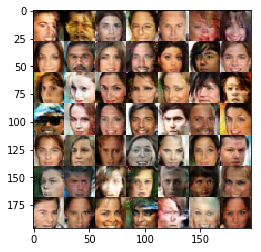

Epoch 2/2... Discriminator Loss: 1.3107... Generator Loss: 0.8314
Epoch 2/2... Discriminator Loss: 1.3164... Generator Loss: 0.8109
Epoch 2/2... Discriminator Loss: 1.3336... Generator Loss: 0.9198
Epoch 2/2... Discriminator Loss: 1.2129... Generator Loss: 0.7161
Epoch 2/2... Discriminator Loss: 1.2634... Generator Loss: 0.8435
Epoch 2/2... Discriminator Loss: 1.3000... Generator Loss: 0.6732
Epoch 2/2... Discriminator Loss: 1.2906... Generator Loss: 0.9326
Epoch 2/2... Discriminator Loss: 1.3691... Generator Loss: 0.5769
Epoch 2/2... Discriminator Loss: 1.2765... Generator Loss: 0.8783
Epoch 2/2... Discriminator Loss: 1.3841... Generator Loss: 0.6653


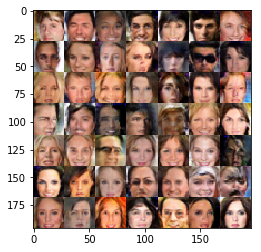

Epoch 2/2... Discriminator Loss: 1.3582... Generator Loss: 0.8444
Epoch 2/2... Discriminator Loss: 1.2668... Generator Loss: 0.6573
Epoch 2/2... Discriminator Loss: 1.3996... Generator Loss: 0.7350
Epoch 2/2... Discriminator Loss: 1.3521... Generator Loss: 0.7713
Epoch 2/2... Discriminator Loss: 1.3257... Generator Loss: 0.8908
Epoch 2/2... Discriminator Loss: 1.3130... Generator Loss: 0.8612
Epoch 2/2... Discriminator Loss: 1.4200... Generator Loss: 0.8652
Epoch 2/2... Discriminator Loss: 1.3580... Generator Loss: 0.8253
Epoch 2/2... Discriminator Loss: 1.3765... Generator Loss: 0.8815
Epoch 2/2... Discriminator Loss: 1.2604... Generator Loss: 0.8022


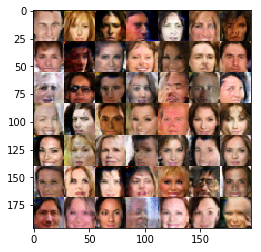

Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6608
Epoch 2/2... Discriminator Loss: 1.3163... Generator Loss: 0.7107
Epoch 2/2... Discriminator Loss: 1.2510... Generator Loss: 0.7202
Epoch 2/2... Discriminator Loss: 1.2965... Generator Loss: 0.7990
Epoch 2/2... Discriminator Loss: 1.3532... Generator Loss: 0.7742
Epoch 2/2... Discriminator Loss: 1.3615... Generator Loss: 0.9729
Epoch 2/2... Discriminator Loss: 1.3116... Generator Loss: 0.7044
Epoch 2/2... Discriminator Loss: 1.1912... Generator Loss: 0.7996
Epoch 2/2... Discriminator Loss: 1.1280... Generator Loss: 0.7500
Epoch 2/2... Discriminator Loss: 1.3640... Generator Loss: 0.9157


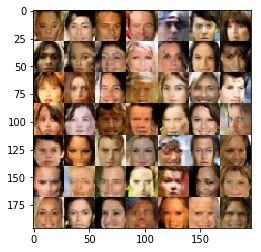

Epoch 2/2... Discriminator Loss: 1.3350... Generator Loss: 0.5925
Epoch 2/2... Discriminator Loss: 1.3194... Generator Loss: 0.9327
Epoch 2/2... Discriminator Loss: 1.2811... Generator Loss: 0.6798
Epoch 2/2... Discriminator Loss: 1.2309... Generator Loss: 0.8362
Epoch 2/2... Discriminator Loss: 1.2482... Generator Loss: 0.9535
Epoch 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.8772
Epoch 2/2... Discriminator Loss: 1.4045... Generator Loss: 0.6459
Epoch 2/2... Discriminator Loss: 1.2806... Generator Loss: 0.7390
Epoch 2/2... Discriminator Loss: 1.3838... Generator Loss: 0.8308
Epoch 2/2... Discriminator Loss: 1.2148... Generator Loss: 0.9131


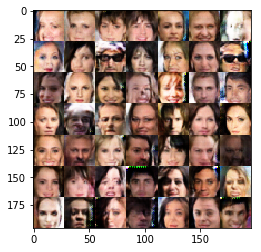

Epoch 2/2... Discriminator Loss: 1.4957... Generator Loss: 0.5854
Epoch 2/2... Discriminator Loss: 1.3885... Generator Loss: 0.5875
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.5606
Epoch 2/2... Discriminator Loss: 1.4183... Generator Loss: 0.5268
Epoch 2/2... Discriminator Loss: 1.2901... Generator Loss: 0.7264
Epoch 2/2... Discriminator Loss: 1.1811... Generator Loss: 0.6830
Epoch 2/2... Discriminator Loss: 1.3051... Generator Loss: 0.7050
Epoch 2/2... Discriminator Loss: 1.3369... Generator Loss: 0.6621
Epoch 2/2... Discriminator Loss: 1.3267... Generator Loss: 0.8592
Epoch 2/2... Discriminator Loss: 1.3161... Generator Loss: 0.8266


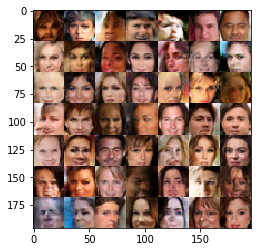

Epoch 2/2... Discriminator Loss: 1.3337... Generator Loss: 1.0470
Epoch 2/2... Discriminator Loss: 1.3662... Generator Loss: 0.6680
Epoch 2/2... Discriminator Loss: 1.2441... Generator Loss: 0.7699
Epoch 2/2... Discriminator Loss: 1.3404... Generator Loss: 0.8172
Epoch 2/2... Discriminator Loss: 1.3459... Generator Loss: 0.7539
Epoch 2/2... Discriminator Loss: 1.2499... Generator Loss: 0.9348
Epoch 2/2... Discriminator Loss: 1.3939... Generator Loss: 0.8322
Epoch 2/2... Discriminator Loss: 1.3003... Generator Loss: 0.7944
Epoch 2/2... Discriminator Loss: 1.3160... Generator Loss: 0.9146
Epoch 2/2... Discriminator Loss: 1.2270... Generator Loss: 0.8546


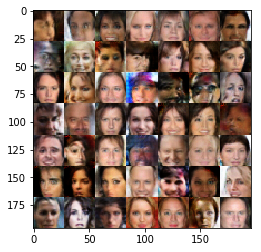

Epoch 2/2... Discriminator Loss: 1.2973... Generator Loss: 1.0300
Epoch 2/2... Discriminator Loss: 1.2387... Generator Loss: 0.7786
Epoch 2/2... Discriminator Loss: 1.2083... Generator Loss: 0.8044
Epoch 2/2... Discriminator Loss: 1.3921... Generator Loss: 1.0302
Epoch 2/2... Discriminator Loss: 1.3600... Generator Loss: 0.9431
Epoch 2/2... Discriminator Loss: 1.3810... Generator Loss: 0.6799
Epoch 2/2... Discriminator Loss: 1.3699... Generator Loss: 0.6674
Epoch 2/2... Discriminator Loss: 1.2491... Generator Loss: 0.8747
Epoch 2/2... Discriminator Loss: 1.3223... Generator Loss: 0.8122
Epoch 2/2... Discriminator Loss: 1.2291... Generator Loss: 0.7425


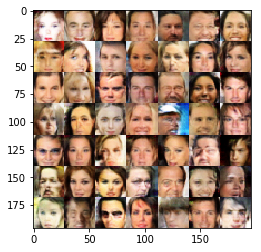

Epoch 2/2... Discriminator Loss: 1.3320... Generator Loss: 0.7260
Epoch 2/2... Discriminator Loss: 1.2945... Generator Loss: 0.7620
Epoch 2/2... Discriminator Loss: 1.1535... Generator Loss: 0.7837
Epoch 2/2... Discriminator Loss: 1.3406... Generator Loss: 0.6407
Epoch 2/2... Discriminator Loss: 1.3601... Generator Loss: 0.7224
Epoch 2/2... Discriminator Loss: 1.4781... Generator Loss: 0.6204
Epoch 2/2... Discriminator Loss: 1.3184... Generator Loss: 0.8521
Epoch 2/2... Discriminator Loss: 1.4064... Generator Loss: 0.6840
Epoch 2/2... Discriminator Loss: 1.3368... Generator Loss: 0.8501
Epoch 2/2... Discriminator Loss: 1.6265... Generator Loss: 0.4444


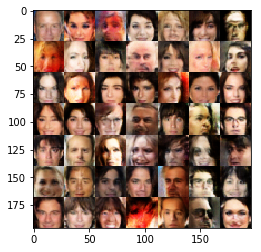

Epoch 2/2... Discriminator Loss: 1.3792... Generator Loss: 0.7979
Epoch 2/2... Discriminator Loss: 1.3799... Generator Loss: 0.7683
Epoch 2/2... Discriminator Loss: 1.2589... Generator Loss: 0.7140
Epoch 2/2... Discriminator Loss: 1.3278... Generator Loss: 0.6787
Epoch 2/2... Discriminator Loss: 1.3016... Generator Loss: 0.7823
Epoch 2/2... Discriminator Loss: 1.3254... Generator Loss: 0.8696
Epoch 2/2... Discriminator Loss: 1.1989... Generator Loss: 0.8730
Epoch 2/2... Discriminator Loss: 1.3839... Generator Loss: 0.9794
Epoch 2/2... Discriminator Loss: 1.3020... Generator Loss: 0.8870
Epoch 2/2... Discriminator Loss: 1.2506... Generator Loss: 0.8062


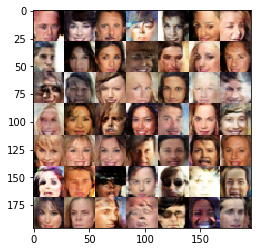

Epoch 2/2... Discriminator Loss: 1.3703... Generator Loss: 0.8667
Epoch 2/2... Discriminator Loss: 1.2526... Generator Loss: 0.7425
Epoch 2/2... Discriminator Loss: 1.3016... Generator Loss: 0.9001
Epoch 2/2... Discriminator Loss: 1.4111... Generator Loss: 0.8257
Epoch 2/2... Discriminator Loss: 1.5865... Generator Loss: 1.3430
Epoch 2/2... Discriminator Loss: 1.3481... Generator Loss: 0.7353
Epoch 2/2... Discriminator Loss: 1.3953... Generator Loss: 0.7228
Epoch 2/2... Discriminator Loss: 1.2984... Generator Loss: 0.8688
Epoch 2/2... Discriminator Loss: 1.2805... Generator Loss: 0.7267
Epoch 2/2... Discriminator Loss: 1.3929... Generator Loss: 1.1884


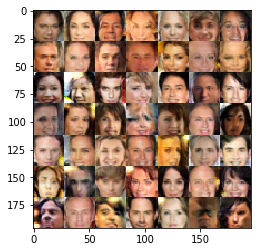

Epoch 2/2... Discriminator Loss: 1.2704... Generator Loss: 0.7249
Epoch 2/2... Discriminator Loss: 1.3832... Generator Loss: 0.7109
Epoch 2/2... Discriminator Loss: 1.4396... Generator Loss: 0.8150
Epoch 2/2... Discriminator Loss: 1.2719... Generator Loss: 0.9102
Epoch 2/2... Discriminator Loss: 1.4369... Generator Loss: 0.6628
Epoch 2/2... Discriminator Loss: 1.2165... Generator Loss: 0.9185
Epoch 2/2... Discriminator Loss: 1.4279... Generator Loss: 0.7786
Epoch 2/2... Discriminator Loss: 1.3650... Generator Loss: 0.7004
Epoch 2/2... Discriminator Loss: 1.2769... Generator Loss: 0.6523
Epoch 2/2... Discriminator Loss: 1.1443... Generator Loss: 0.8785


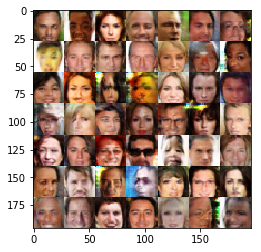

Epoch 2/2... Discriminator Loss: 1.1845... Generator Loss: 0.7016
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 0.8336
Epoch 2/2... Discriminator Loss: 1.1889... Generator Loss: 0.9013
Epoch 2/2... Discriminator Loss: 1.2724... Generator Loss: 0.7404
Epoch 2/2... Discriminator Loss: 1.1195... Generator Loss: 0.7756
Epoch 2/2... Discriminator Loss: 1.3087... Generator Loss: 0.7759
Epoch 2/2... Discriminator Loss: 1.2069... Generator Loss: 0.8875
Epoch 2/2... Discriminator Loss: 1.4380... Generator Loss: 0.6350
Epoch 2/2... Discriminator Loss: 1.4060... Generator Loss: 0.6818
Epoch 2/2... Discriminator Loss: 1.3794... Generator Loss: 0.8600


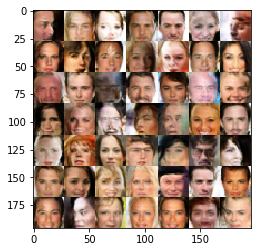

Epoch 2/2... Discriminator Loss: 1.2514... Generator Loss: 0.7339
Epoch 2/2... Discriminator Loss: 1.2171... Generator Loss: 0.7915
Epoch 2/2... Discriminator Loss: 1.3301... Generator Loss: 0.8095


In [14]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.